## Pooja Patel

In [ ]:
# installed necessary libraries
!pip install pystan==2.19.1.1
!pip install fbprophet

In [ ]:
import plotly.io as pio
pio.renderers.default = "colab"
import pandas as pd
import plotly.express as px
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly


In [ ]:
df = pd.read_csv('/content/sample_data/SN_d_tot_V2.0.csv',sep=';',header=None,names=['Year','Month','Day','Decimal date','Daily sunspot number','Standard deviation','Number of observations','Definitive/provisional indicator'])
df

,Year,Month,Day,Decimal date,Daily sunspot number,Standard deviation,Number of observations,Definitive/provisional indicator
0,1818,1,1,1818.001,-1,-1.0,0,1
1,1818,1,2,1818.004,-1,-1.0,0,1
2,1818,1,3,1818.007,-1,-1.0,0,1
3,1818,1,4,1818.010,-1,-1.0,0,1
4,1818,1,5,1818.012,-1,-1.0,0,1
...,...,...,...,...,...,...,...,...
74625,2022,4,26,2022.316,132,21.8,43,0
74626,2022,4,27,2022.319,132,14.8,43,0
74627,2022,4,28,2022.322,135,15.5,42,0
74628,2022,4,29,2022.325,107,21.4,39,0


In [ ]:
df.isnull().sum()

Year                                0
Month                               0
Day                                 0
Decimal date                        0
Daily sunspot number                0
Standard deviation                  0
Number of observations              0
Definitive/provisional indicator    0
dtype: int64

In [ ]:
# -1 consider into NaN values, replacing with 0
df['Daily sunspot number'] = df['Daily sunspot number'].replace(-1,0)
df.head()

,Year,Month,Day,Decimal date,Daily sunspot number,Standard deviation,Number of observations,Definitive/provisional indicator
0,1818,1,1,1818.001,0,-1.0,0,1
1,1818,1,2,1818.004,0,-1.0,0,1
2,1818,1,3,1818.007,0,-1.0,0,1
3,1818,1,4,1818.010,0,-1.0,0,1
4,1818,1,5,1818.012,0,-1.0,0,1


In [ ]:
df.dtypes

Year                                  int64
Month                                 int64
Day                                   int64
Decimal date                        float64
Daily sunspot number                  int64
Standard deviation                  float64
Number of observations                int64
Definitive/provisional indicator      int64
dtype: object

In [ ]:
# merge Year, Month and Day column into Date and convert into datetime
df['Year'] = df['Year'].astype('str')
df['Month'] = df['Month'].astype('str')
df['Day'] = df['Day'].astype('int').astype('str')
df.insert (0, "Date",  pd.DatetimeIndex(df['Year']+'-'+df['Month']+'-'+df['Day']))

In [ ]:
df.head()

,Date,Year,Month,Day,Decimal date,Daily sunspot number,Standard deviation,Number of observations,Definitive/provisional indicator
0,1818-01-01,1818,1,1,1818.001,0,-1.0,0,1
1,1818-01-02,1818,1,2,1818.004,0,-1.0,0,1
2,1818-01-03,1818,1,3,1818.007,0,-1.0,0,1
3,1818-01-04,1818,1,4,1818.010,0,-1.0,0,1
4,1818-01-05,1818,1,5,1818.012,0,-1.0,0,1


In [ ]:
df.dtypes

Date                                datetime64[ns]
Year                                        object
Month                                       object
Day                                         object
Decimal date                               float64
Daily sunspot number                         int64
Standard deviation                         float64
Number of observations                       int64
Definitive/provisional indicator             int64
dtype: object

In [ ]:
def plot_raw_data(df,col1,col2,title):
  fig = px.line(df, x=col1,y=col2, title=title)
  fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=10, label="10y", step="year", stepmode="backward"),
            dict(count=20, label="20y", step="year", stepmode="backward"),
            dict(count=30, label="30y", step="year", stepmode="backward"),
            dict(count=40, label="40y", step="year", stepmode="backward"),
            dict(count=50, label="50y", step="year", stepmode="backward"),
            dict(step="all")
        ])
     )
  )
  return fig.show()


In [ ]:
# 10 year solar cycle effect on daily sunspot
# Sunspots varies approximately 11-year solar cycle
plot_raw_data(df=df,col1='Date',col2='Daily sunspot number',title='Daily Sunspot Slider')

In [ ]:
df1 = df.copy()

In [ ]:
df1.drop(['Year','Month','Day','Decimal date','Standard deviation','Number of observations','Definitive/provisional indicator'],axis=1,inplace=True)


In [ ]:
df1.columns

Index(['Date', 'Daily sunspot number'], dtype='object')

In [ ]:
df1.columns = ['ds','y']

In [ ]:
df1

,ds,y
0,1818-01-01,0
1,1818-01-02,0
2,1818-01-03,0
3,1818-01-04,0
4,1818-01-05,0
...,...,...
74625,2022-04-26,132
74626,2022-04-27,132
74627,2022-04-28,135
74628,2022-04-29,107


## Train Model
### Forecast Growth : Linear (default)

In [ ]:
m = Prophet(daily_seasonality= True)
model = m.fit(df1)

## Forecast Model

In [ ]:
# days 100
future = m.make_future_dataframe(periods=100,freq='D')
forecast = m.predict(future)

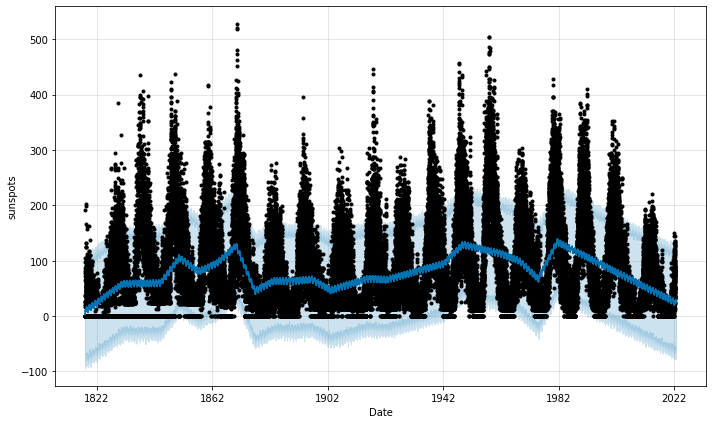

In [ ]:
# Draw forecast results
fig = m.plot(forecast, xlabel = 'Date', ylabel = 'sunspots')

In [ ]:
# predicted montlhy sunspots chart closer look
import plotly.graph_objects as go

def plot_daily_graph(fcst_df,col1,count,label):
    df11 = fcst_df[fcst_df[col1]>='2022-05-01']
    fig = go.Figure([go.Scatter(x=df11['ds'], y=df11['yhat'])])
    # fig.update_xaxes(rangeslider_visible=True)
    fig.update_xaxes(
          rangeslider_visible=True,
          rangeselector=dict(
              buttons=list([
                  dict(count=count, label=label, step="day", stepmode="backward"),
                  dict(step="all")
              ])
          )
      )
    return fig.show()

In [ ]:
plot_daily_graph(fcst_df=forecast,col1='ds',count=100,label='100d')

In [ ]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1818-01-01,1.812307,-75.790264,97.596922,1.812307,1.812307,1.969754,1.969754,1.969754,7.317623,...,0.097909,0.097909,0.097909,-5.445778,-5.445778,-5.445778,0.0,0.0,0.0,3.782061
1,1818-01-02,1.822699,-87.560151,94.084533,1.822699,1.822699,1.321007,1.321007,1.321007,7.317623,...,-0.374629,-0.374629,-0.374629,-5.621987,-5.621987,-5.621987,0.0,0.0,0.0,3.143706
2,1818-01-03,1.833092,-94.707142,97.650751,1.833092,1.833092,1.664932,1.664932,1.664932,7.317623,...,0.123258,0.123258,0.123258,-5.775949,-5.775949,-5.775949,0.0,0.0,0.0,3.498024
3,1818-01-04,1.843485,-89.608553,98.525162,1.843485,1.843485,1.290408,1.290408,1.290408,7.317623,...,-0.121065,-0.121065,-0.121065,-5.906149,-5.906149,-5.906149,0.0,0.0,0.0,3.133893
4,1818-01-05,1.853877,-91.380045,98.385383,1.853877,1.853877,1.384175,1.384175,1.384175,7.317623,...,0.078038,0.078038,0.078038,-6.011486,-6.011486,-6.011486,0.0,0.0,0.0,3.238052


In [ ]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
74725,2022-08-04,17.170462,-60.813142,116.223277,17.170462,17.170462,8.320465,8.320465,8.320465,7.317623,...,0.097909,0.097909,0.097909,0.904932,0.904932,0.904932,0.0,0.0,0.0,25.490927
74726,2022-08-05,17.163153,-66.219756,128.310415,17.163153,17.163153,8.130231,8.130231,8.130231,7.317623,...,-0.374629,-0.374629,-0.374629,1.187237,1.187237,1.187237,0.0,0.0,0.0,25.293384
74727,2022-08-06,17.155844,-70.464387,115.345227,17.155844,17.155844,8.932478,8.932478,8.932478,7.317623,...,0.123258,0.123258,0.123258,1.491598,1.491598,1.491598,0.0,0.0,0.0,26.088323
74728,2022-08-07,17.148535,-67.514127,115.067135,17.148535,17.148535,9.009557,9.009557,9.009557,7.317623,...,-0.121065,-0.121065,-0.121065,1.812999,1.812999,1.812999,0.0,0.0,0.0,26.158093
74729,2022-08-08,17.141226,-63.412928,120.820197,17.141226,17.141226,9.541767,9.541767,9.541767,7.317623,...,0.078038,0.078038,0.078038,2.146105,2.146105,2.146105,0.0,0.0,0.0,26.682993


In [ ]:
fig = plot_components_plotly(m, forecast)
fig.show()

### 200 days

In [ ]:
# 200 days
future_200 = m.make_future_dataframe(periods=200,freq='D')
forecast_200 = m.predict(future_200)
plot_daily_graph(fcst_df=forecast_200,col1='ds',count=200,label='200d')


fig = plot_components_plotly(m, forecast_200)
fig.show()

In [ ]:
forecast_200.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1818-01-01,1.812307,-90.450608,94.799204,1.812307,1.812307,1.969754,1.969754,1.969754,7.317623,...,0.097909,0.097909,0.097909,-5.445778,-5.445778,-5.445778,0.0,0.0,0.0,3.782061
1,1818-01-02,1.822699,-89.207557,92.382979,1.822699,1.822699,1.321007,1.321007,1.321007,7.317623,...,-0.374629,-0.374629,-0.374629,-5.621987,-5.621987,-5.621987,0.0,0.0,0.0,3.143706
2,1818-01-03,1.833092,-87.479836,98.241527,1.833092,1.833092,1.664932,1.664932,1.664932,7.317623,...,0.123258,0.123258,0.123258,-5.775949,-5.775949,-5.775949,0.0,0.0,0.0,3.498024
3,1818-01-04,1.843485,-89.845383,94.960211,1.843485,1.843485,1.290408,1.290408,1.290408,7.317623,...,-0.121065,-0.121065,-0.121065,-5.906149,-5.906149,-5.906149,0.0,0.0,0.0,3.133893
4,1818-01-05,1.853877,-93.839400,87.945275,1.853877,1.853877,1.384175,1.384175,1.384175,7.317623,...,0.078038,0.078038,0.078038,-6.011486,-6.011486,-6.011486,0.0,0.0,0.0,3.238052


In [ ]:
forecast_200.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
74825,2022-11-12,16.439567,-73.658851,106.115787,16.439567,16.439567,4.177909,4.177909,4.177909,7.317623,...,0.123258,0.123258,0.123258,-3.262971,-3.262971,-3.262971,0.0,0.0,0.0,20.617477
74826,2022-11-13,16.432259,-65.755926,111.868043,16.432259,16.432259,3.647759,3.647759,3.647759,7.317623,...,-0.121065,-0.121065,-0.121065,-3.548798,-3.548798,-3.548798,0.0,0.0,0.0,20.080018
74827,2022-11-14,16.424950,-72.365425,113.078277,16.424950,16.424950,3.571566,3.571566,3.571566,7.317623,...,0.078038,0.078038,0.078038,-3.824095,-3.824095,-3.824095,0.0,0.0,0.0,19.996516
74828,2022-11-15,16.417641,-72.257355,112.701314,16.417641,16.417641,3.223325,3.223325,3.223325,7.317623,...,-0.009603,-0.009603,-0.009603,-4.084695,-4.084695,-4.084695,0.0,0.0,0.0,19.640966
74829,2022-11-16,16.410332,-65.757758,108.667874,16.410332,16.410332,3.197154,3.197154,3.197154,7.317623,...,0.206093,0.206093,0.206093,-4.326562,-4.326562,-4.326562,0.0,0.0,0.0,19.607485


### 365 days

In [ ]:
# 365 days
future_365 = m.make_future_dataframe(periods=365,freq='D')
forecast_365 = m.predict(future_365)
plot_daily_graph(fcst_df=forecast_365,col1='ds',count=365,label='365d')

fig = plot_components_plotly(m, forecast_365)
fig.show()

*  Based on above graph, we can observed that from **May to August** month the number of sunspots are **highest** campare to other months. It may be possible due to **summer and hot weather** it increasing.
*  And after october it started decreasing and on **November** its **lowest** among all the months. May be due to **cool weather** its lowest.
*   For weekly, **Tuesday to Thursday** sunspots are increasing, may be due higher fuel consumption. On weekends fuel consumption are lower.  




In [ ]:
forecast_365.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1818-01-01,1.812307,-89.903508,93.588962,1.812307,1.812307,1.969754,1.969754,1.969754,7.317623,...,0.097909,0.097909,0.097909,-5.445778,-5.445778,-5.445778,0.0,0.0,0.0,3.782061
1,1818-01-02,1.822699,-90.485079,101.512504,1.822699,1.822699,1.321007,1.321007,1.321007,7.317623,...,-0.374629,-0.374629,-0.374629,-5.621987,-5.621987,-5.621987,0.0,0.0,0.0,3.143706
2,1818-01-03,1.833092,-82.651339,94.650914,1.833092,1.833092,1.664932,1.664932,1.664932,7.317623,...,0.123258,0.123258,0.123258,-5.775949,-5.775949,-5.775949,0.0,0.0,0.0,3.498024
3,1818-01-04,1.843485,-89.091513,97.897565,1.843485,1.843485,1.290408,1.290408,1.290408,7.317623,...,-0.121065,-0.121065,-0.121065,-5.906149,-5.906149,-5.906149,0.0,0.0,0.0,3.133893
4,1818-01-05,1.853877,-89.614682,94.692296,1.853877,1.853877,1.384175,1.384175,1.384175,7.317623,...,0.078038,0.078038,0.078038,-6.011486,-6.011486,-6.011486,0.0,0.0,0.0,3.238052


In [ ]:
df1.shape

(74630, 2)

### Model evalution

In [ ]:
# spliting data into 70:30 ratio
def split_data(df1):
    train_size = int(df1.shape[0]*0.70)
    print("train size :", train_size)
    test_size = int(df1.shape[0]*0.30)
    print("test size :", test_size)
    print("\n")
    train_df = df1.head(train_size)
    print("train df :")
    print(train_df)
    test_df = df1.tail(test_size)
    print("\ntest df :")
    print(test_df)
    return train_df, test_df

In [ ]:
import math
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
def get_metrics(graph_df):
    y_test = graph_df['y']
    predicted = graph_df['yhat']
    MAE = round(mean_absolute_error(y_test, predicted), 4)
    RMSE = round(math.sqrt(mean_squared_error(y_test, predicted)), 4)
    MAPE = round(mean_absolute_percentage_error(y_test, predicted),4)
    R2 = round(r2_score(y_test, predicted),4)
    return MAE, RMSE, MAPE, R2


In [ ]:
train_df, test_df = split_data(df1=df1)

train size : 52241
test size : 22389


train df :
              ds   y
0     1818-01-01   0
1     1818-01-02   0
2     1818-01-03   0
3     1818-01-04   0
4     1818-01-05   0
...          ...  ..
52236 1961-01-07  89
52237 1961-01-08  82
52238 1961-01-09  86
52239 1961-01-10  75
52240 1961-01-11  61

[52241 rows x 2 columns]

test df :
              ds    y
52241 1961-01-12   50
52242 1961-01-13   40
52243 1961-01-14   36
52244 1961-01-15   39
52245 1961-01-16   61
...          ...  ...
74625 2022-04-26  132
74626 2022-04-27  132
74627 2022-04-28  135
74628 2022-04-29  107
74629 2022-04-30   51

[22389 rows x 2 columns]


In [ ]:
m1 = Prophet(daily_seasonality=True)
m1.fit(test_df)

In [ ]:
forecast1 = m1.predict(m1.make_future_dataframe(periods=0,freq='D'))
forecast1.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1961-01-12,54.692573,21.983511,127.373794,54.692573,54.692573,20.632673,20.632673,20.632673,23.218981,...,0.188873,0.188873,0.188873,-2.775181,-2.775181,-2.775181,0.0,0.0,0.0,75.325246
1,1961-01-13,54.648149,21.189905,130.942302,54.648149,54.648149,21.232475,21.232475,21.232475,23.218981,...,0.304111,0.304111,0.304111,-2.290617,-2.290617,-2.290617,0.0,0.0,0.0,75.880624
2,1961-01-14,54.603725,20.308910,134.566275,54.603725,54.603725,21.355509,21.355509,21.355509,23.218981,...,-0.056373,-0.056373,-0.056373,-1.807099,-1.807099,-1.807099,0.0,0.0,0.0,75.959234
3,1961-01-15,54.559301,25.299545,131.005282,54.559301,54.559301,21.582633,21.582633,21.582633,23.218981,...,-0.300016,-0.300016,-0.300016,-1.336331,-1.336331,-1.336331,0.0,0.0,0.0,76.141935
4,1961-01-16,54.514878,22.089373,130.495656,54.514878,54.514878,22.171497,22.171497,22.171497,23.218981,...,-0.158287,-0.158287,-0.158287,-0.889197,-0.889197,-0.889197,0.0,0.0,0.0,76.686375


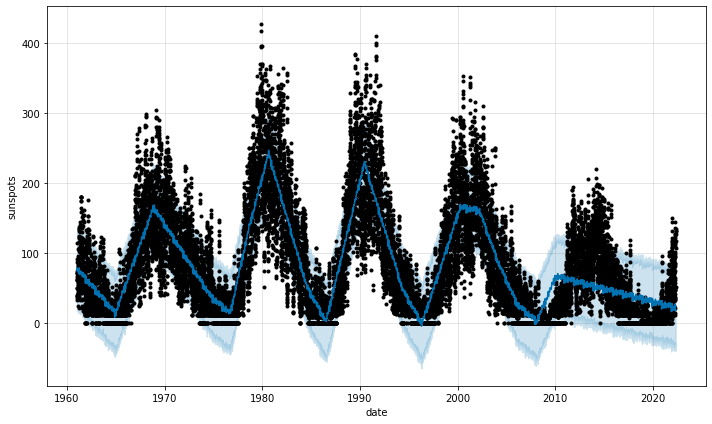

In [ ]:
fig = m1.plot(forecast1, xlabel = 'date', ylabel = 'sunspots')

In [ ]:
graph_df = pd.merge(test_df[['ds','y']], forecast1[['ds','yhat']], on='ds')
graph_df.head()

,ds,y,yhat
0,1961-01-12,50,75.325246
1,1961-01-13,40,75.880624
2,1961-01-14,36,75.959234
3,1961-01-15,39,76.141935
4,1961-01-16,61,76.686375


In [ ]:
MAE, RMSE, MAPE, R2 = get_metrics(graph_df)
print("  MAE : {} \n  RMSE : {} \n  MAPE : {}  \n  R2 : {} \n".format(MAE, RMSE, MAPE, R2))

  MAE : 32.3805 
  RMSE : 42.7108 
  MAPE : 1.5958534361250166e+16  
  R2 : 0.6738 



## Adding ChangePoints to Prophet

* Changepoints are the datetime points where the time series have abrupt changes in the trajectory.

* By default, Prophet adds 25 changepoints to the initial 80% of the data-set.

* Let’s plot the vertical lines where the potential changepoints occurred.

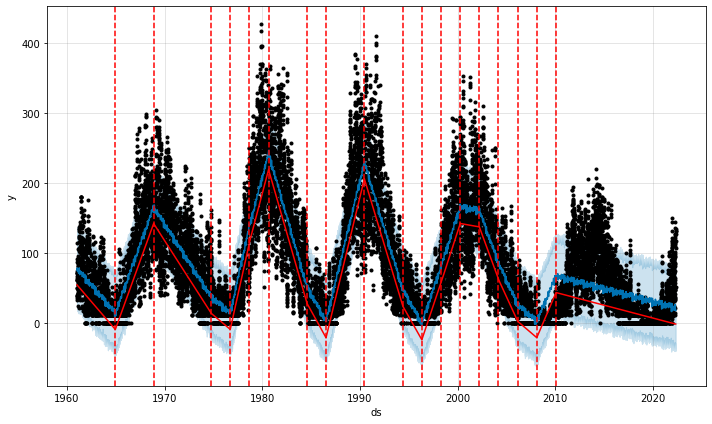

In [ ]:
from fbprophet.plot import add_changepoints_to_plot
fig = m1.plot(forecast1)
a = add_changepoints_to_plot(fig.gca(), m1, forecast1)

In [ ]:
m1.changepoints

716     1962-12-29
1433    1964-12-15
2149    1966-12-01
2866    1968-11-17
3582    1970-11-03
4298    1972-10-19
5015    1974-10-06
5731    1976-09-21
6448    1978-09-08
7164    1980-08-24
7880    1982-08-10
8597    1984-07-27
9313    1986-07-13
10030   1988-06-29
10746   1990-06-15
11462   1992-05-31
12179   1994-05-18
12895   1996-05-03
13612   1998-04-20
14328   2000-04-05
15044   2002-03-22
15761   2004-03-08
16477   2006-02-22
17194   2008-02-09
17910   2010-01-25
Name: ds, dtype: datetime64[ns]

## Forecast growth : Logistic

In [ ]:
df1['cap'] = df1['y'].max()
m_log = Prophet(daily_seasonality= True, growth='logistic',changepoint_range=1, changepoint_prior_scale=1)

In [ ]:
m_log.fit(df1)

In [ ]:
future_log = m_log.make_future_dataframe(periods=365,freq='D')
future_log['cap'] = df1['y'].max()

In [ ]:
forecast_log = m_log.predict(future_log)

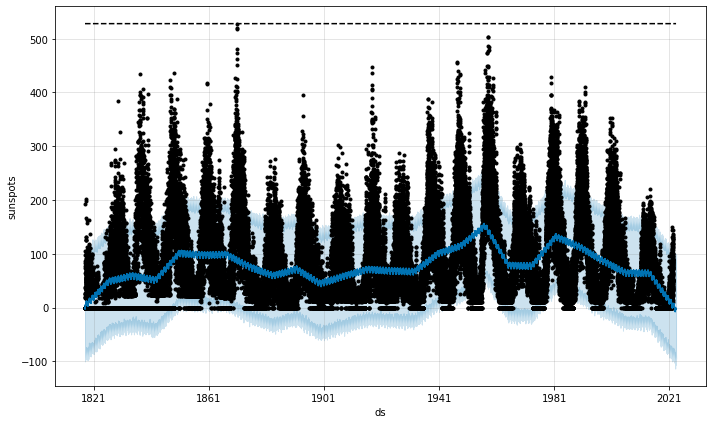

In [ ]:
fig = m_log.plot(forecast_log, xlabel = 'ds', ylabel = 'sunspots')

In [ ]:
fig = plot_components_plotly(m_log, forecast_log)
fig.show()

### Model evalution of logistic

In [ ]:
# split the data into 70:30 ratio
train_df, test_df = split_data(df1=df1)

# tune the model
m1_log = Prophet(daily_seasonality=True, growth='logistic', changepoint_range=1, changepoint_prior_scale=1)
m1_log.fit(test_df)

train size : 52241
test size : 22389


train df :
              ds   y  cap
0     1818-01-01   0  528
1     1818-01-02   0  528
2     1818-01-03   0  528
3     1818-01-04   0  528
4     1818-01-05   0  528
...          ...  ..  ...
52236 1961-01-07  89  528
52237 1961-01-08  82  528
52238 1961-01-09  86  528
52239 1961-01-10  75  528
52240 1961-01-11  61  528

[52241 rows x 3 columns]

test df :
              ds    y  cap
52241 1961-01-12   50  528
52242 1961-01-13   40  528
52243 1961-01-14   36  528
52244 1961-01-15   39  528
52245 1961-01-16   61  528
...          ...  ...  ...
74625 2022-04-26  132  528
74626 2022-04-27  132  528
74627 2022-04-28  135  528
74628 2022-04-29  107  528
74629 2022-04-30   51  528

[22389 rows x 3 columns]


In [ ]:
future1_log  = m1_log.make_future_dataframe(periods=0,freq='D')
future1_log['cap'] = df1['y'].max()
forecast1_log = m1_log.predict(future1_log)
forecast1_log.head()

,ds,trend,cap,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1961-01-12,155.833667,528,-18.337119,88.920578,155.833667,155.833667,-120.841955,-120.841955,-120.841955,...,0.194173,0.194173,0.194173,-2.798213,-2.798213,-2.798213,0.0,0.0,0.0,34.991713
1,1961-01-13,155.833711,528,-22.593632,85.614524,155.833711,155.833711,-120.208731,-120.208731,-120.208731,...,0.308555,0.308555,0.308555,-2.279372,-2.279372,-2.279372,0.0,0.0,0.0,35.624980
2,1961-01-14,155.833754,528,-16.518762,86.376114,155.833754,155.833754,-120.058247,-120.058247,-120.058247,...,-0.058072,-0.058072,-0.058072,-1.762260,-1.762260,-1.762260,0.0,0.0,0.0,35.775508
3,1961-01-15,155.833798,528,-15.247545,90.775768,155.833798,155.833798,-119.797562,-119.797562,-119.797562,...,-0.300607,-0.300607,-0.300607,-1.259041,-1.259041,-1.259041,0.0,0.0,0.0,36.036236
4,1961-01-16,155.833841,528,-17.933306,90.436051,155.833841,155.833841,-119.178615,-119.178615,-119.178615,...,-0.159673,-0.159673,-0.159673,-0.781027,-0.781027,-0.781027,0.0,0.0,0.0,36.655227


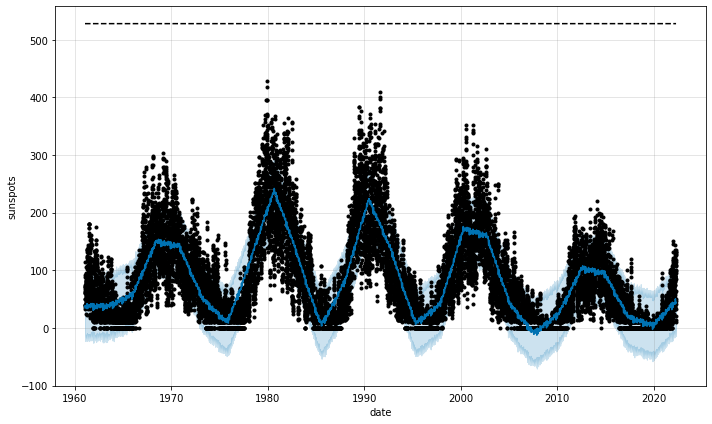

In [ ]:
fig = m1_log.plot(forecast1_log, xlabel = 'date', ylabel = 'sunspots')

In [ ]:
graph_df_log = pd.merge(test_df[['ds','y']], forecast1_log[['ds','yhat']], on='ds')
graph_df_log.head()

,ds,y,yhat
0,1961-01-12,50,63.455511
1,1961-01-13,40,64.067410
2,1961-01-14,36,64.202186
3,1961-01-15,39,64.447448
4,1961-01-16,61,65.043620


In [ ]:
graph_df_log.tail()

,ds,y,yhat
22384,2022-04-26,132,19.909128
22385,2022-04-27,132,20.332991
22386,2022-04-28,135,20.488490
22387,2022-04-29,107,20.816618
22388,2022-04-30,51,20.726504


In [ ]:
MAE, RMSE, MAPE, R2 = get_metrics(graph_df=graph_df_log)
print("  MAE : {} \n  RMSE : {} \n  MAPE : {}  \n  R2 : {} \n".format(MAE, RMSE, MAPE, R2))

  MAE : 55.6097 
  RMSE : 68.9432 
  MAPE : 3.630270594522957e+16  
  R2 : 0.15 



### changing points (Logistic growth)

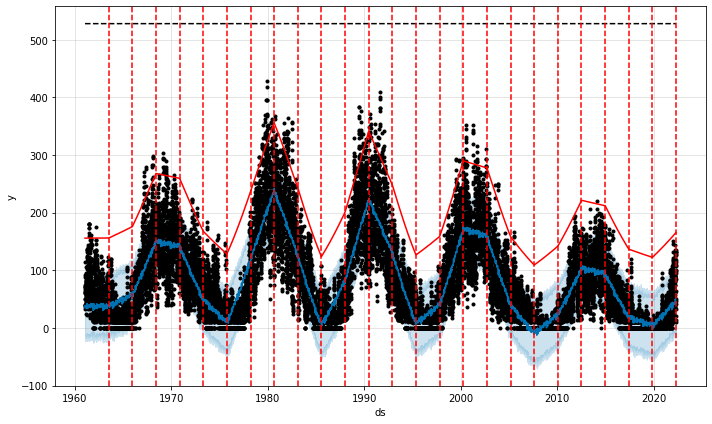

In [ ]:
fig = m1_log.plot(forecast1_log)
a = add_changepoints_to_plot(fig.gca(), m1_log, forecast1_log)

Linear growth gives lesser error in forecasting sunspots. But the ideal prediction in trems of trends & actual and predicted value, Logistic Growth is performing better results.